# 3. Markov Chain Monte Carlo Methods

* 소비자On : 파트 5 - 베이지안 마케팅 [1]
* 김무성

# Contents
* Using this Chapter
* 3.1 MARKOV CHAIN MONTE CARLO METHODS
* 3.2 A SIMPLE EXAMPLE: BIVARIATE NORMAL GIBBS SAMPLER
* 3.3 SOME MARKOV CHAIN THEORY
* 3.4 GIBBS SAMPLER
* 3.5 GIBBS SAMPLER FOR THE SEEMINGLY UNRELATED REGRESSION MODEL
* 3.6 CONDITIONAL DISTRIBUTIONS AND DIRECTED GRAPHS
* 3.7 HIERARCHICAL LINEAR MODELS
* 3.8 DATA AUGMENTATION AND A PROBIT EXAMPLE
* 3.9 MIXTURES OF NORMALS
    - 3.9.1 Identification in Normal Mixtures
    - 3.9.2 Performance of the Unconstrained Gibbs Sampler
* 3.10 METROPOLIS ALGORITHMS
    - 3.10.1 Independence Metropolis Chains
    - 3.10.2 Random-Walk Metropolis Chains
    - 3.10.3 Scaling of the Random-Walk Metropolis
* 3.11 METROPOLIS ALGORITHMS ILLUSTRATED WITH THE MULTINOMIAL LOGIT MODEL
* 3.12 HYBRID MARKOV CHAIN MONTE CARLO METHODS
* 3.13 DIAGNOSTICS

# Using this Chapter

* This chapter provides an introduction to Markov chain Monte Carlo (MCMC) methods and provides detailed discussion of the MCMC methods that have proved especially useful for marketing and micro-econometric problems. 
* In addition, several key examples are developed which help set the stage for more complicated models covered in later chapters.

* In many cases, the posterior distribution is represented by an unnormalized density, π∗(θ), and the problem is to construct simulation-based estimates of various aspects of this distribution. 

# 3.1 MARKOV CHAIN MONTE CARLO METHODS

#### 참고
* [2] http://www.slideshare.net/TomaszKusmierczyk/sampling-and-markov-chain-monte-carlo-techniques

<img src="http://i.stack.imgur.com/e9xI1.gif" />

<img src="http://bit-player.org/wp-content/extras/markov/art/weather-model.png" width=600 />

<img src="http://www.juergenwiki.de/work/wiki/lib/exe/fetch.php?w=500&tok=f4ed3e&media=public:murray_mlss2009talk_mcmc_21.png" width=600 />

* The idea behind MCMC methods is to formulate a Markov chain on the parameter space. If care is taken to ensure that this chain has π(•) as its equilibrium or ‘long-run’ distribution, then the chain can be used to construct simulation-based estimates of the required integrals.

* A Markov chain specifies a method for generating a sequence of random variables {θ1 , θ2 , . . . , θr , . . .} starting from initial point θ0 . This sequence is created by specifying a way of transitioning or moving from θr to θr+1. Since we are dealing with random variables, this transition process is specified by choosing the conditional distribution, θr+1|θr, or θr+1|θr ∼ F(θr). 

* This conditional distribution can be discrete, continuous, or a mixture of discrete and continuous distributions.

* By iterating the conditional distribution forward we construct a joint distribution on the sequence. The fact that this conditional distribution only depends on the last θ (or that θr completely summarizes all information up to this point) is the Markov property which greatly simplifies simulation and analysis of the chain.

####  To simulate from the Markov chain, do the following:

<img src="figures/cap3.1.png" />

#### stationary, invariant, equilibrium distribution

Under some conditions on the conditional distribution F, the distribution of θr|θ0 will converge to a fixed and unique distribution as r goes to infinity. This distribution is called the stationary, invariant, or equilibrium distribution.

If we can construct a Markov chain with stationary distribution π(•) and the conditions for convergence are met, then <font color="red">we can use the Markov chain method to construct a simulation method for estimating the posterior expectation of any function</font>:

<img src="figures/cap3.2.png" width=600 />

#### ergodic

Use of (3.1.1) is asymptotic in the sense that we are relying on the fact that <font color="red">averages of the Markov chain converge (again under some conditions) to the expectation under the stationary distribution</font> :

<img src="figures/cap3.3.png" width=600 />

If a Markov chain satisfies (3.1.2), it is called ergodic.

#### burn-in

* As a practical matter, we will be using large but finite R. Although the theory does not require it, most practitioners will discard some set of initial draws out of concern for the effects of the ‘initial condition’ or value of θ0. This is sometimes called the ‘burn-in’ period. 
* The idea is that it will take a while for the chain to ‘equilibrate’ or shrug off the effects of the initial condition.

If we ‘burn in’ for B draws, then the MCMC estimate is given by

<img src="figures/cap3.4.png" width=600 />

#### The law of large numbers

* Of course, this is an example of a Monte Carlo integration estimate. The difference now is that the draw sequence is not an iid draw sequence. <font color="red">Since we are allowed to condition on the last value in generating the next value in a Markov chain, the draws can be dependent. To some, this dependence is unfamiliar and troublesome</font>.
* <font color="blue">We are relying on something like the law of large numbers to ensure that the sample average converges to the ‘population’ average</font>. Most standard versions of the law of large numbers assume independence. As long as the dependence is not pathologi- cally strong, then the intuition behind the law of large numbers still goes through.
* The practical problem is that these simulation-based estimates may have large sampling errors.
* <font color="red">We are relying on asymptotic theory to justify our use of simulation methods with large samples</font>.
* In particular, we can increase the sample size as necessary and, for most problems, we can generate truly <font color="red">huge simulation samples at moderate computational cost</font>. 
* This means that the practical use of MCMC methods comes much closer to the long-run sampling experiments envisaged by the inventors of asymptotic theory than the usual application of these methods to small and fixed size samples.


The purpose of this introductory section was to give the reader an overview of the basic idea behind MCMC methods. We are a long way from practical application in the sense that we need to provide:

<img src="figures/cap3.5.png" width=600 />

<img src="http://images.slideplayer.com/16/5090074/slides/slide_10.jpg" width=600 />

<img src="http://image.slidesharecdn.com/markov-140514102809-phpapp02/95/hidden-markov-models-5-638.jpg?cb=1400063601" width=600 />

# 3.2 A SIMPLE EXAMPLE: BIVARIATE NORMAL GIBBS SAMPLER

#### 참고
* [4] https://theclevermachine.wordpress.com/2012/11/05/mcmc-the-gibbs-sampler/
* [5] http://web.stanford.edu/class/stats366/Gibbs.html

<img src="http://dnene.bitbucket.org/docs/mlclass-notes/_images/multivariate_gaussian_distribution_2.png" width=600 />

The ideas introduced in Section 3.1 can be better understood by considering one of the most useful and well-used MCMC methods, the Gibbs sampler.

Consider the problem of simulating from the bivariate normal distribution

<img src="figures/cap3.6.png" width=600 />

In Section 2.11.3 the standard method for drawing from the multivariate normal distribution was presented. Recall that we only have to compute the Cholesky root of the covariance matrix and use this to induce the proper level of correlation. Let Z be an R × 2 matrix of iid N (0,1) draws; then we simply compute

<img src="figures/cap3.7.png" width=600 />

The R × 2 matrix 􏰞 is a matrix whose rows are iid draws from (3.2.1).

At point θr = ( θr1 θr2 )′ (here θri is the rth draw of component i), the next random variables (θr+1,1 θr+1,2)′ are constructed by drawing from the two conditional distributions associated with the
bivariate normal,

<img src="figures/cap3.8.png" width=600 />

BIVARIATE NORMAL GIBBS SAMPLER (example)

<img src="figures/cap3.9.png" width=600 />

#### example
* Figure 3.1 illustrates this algorithm for ρ = 0.9 and starting value ( θ01 , θ02 )′ = (2,−2)′. 
* To move away from the initial condition, we first draw the second (vertical) component value. Given that we start from the first component value of 2, we draw (according to (3.2.3)) from an N (0.9 × 2, 0.19) distribution, illustrated by the vertically oriented density curve in Figure 3.1. 
* This distribution is centered at 1.8 but with a fairly large standard deviation of 0.44. 
* A realized value is shown on the figure by the ‘•’ symbol. This realized value is about 1.7, near the mean of the conditional distribution. 
* We now draw the first component given the second value of 1.7 by drawing from an N (0.9 × 1.7, 0.19) distribution.
* These two draws combine to move the chain from the initial value of (2, −2) to a new value of approximately (1, 1.7). This move is denoted by the dotted arrow on the figure.

<img src="figures/cap3.10.png" width=600 />

#### example 
* Figure 3.2 shows a realization of the first 20 draws from the same initial condition as in Figure 3.1. 
* The figure shows both the ‘intermediate’ moves internal to the sampler (that is, the component-by-component updatings) and the final result. 
* Each of these points are connected by lines to trace out the movements. * The fact the intermediate moves are included is the reason why the trace consists of only vertical and horizontal line segments of random length. 
* The chain moves quickly away from the initial condition to the region where the bivariate normal has substantial mass. 
* The reason for this is that the initial value of (2, −2) is highly unusual for this bivariate normal. 
* The conditional distributions capture this immediately by moving the second component to a value more in line with the strong positive correlation.

<img src="figures/cap3.11.png" width=600 />

<img src="figures/cap3.13.png" width=600 />

#### R code example 
* [4] A simple Gibbs sampler - http://www.mas.ncl.ac.uk/~ndjw1/teaching/sim/gibbs/gibbs.html
* [5] Example 1 (Gibbs sampler: Bivariate distribution) - http://staff.ustc.edu.cn/~zwp/teach/Stat-Comp/Lec9.R
* [6] MCMC: The Gibbs Sampler - https://theclevermachine.wordpress.com/2012/11/05/mcmc-the-gibbs-sampler/

In [2]:
rbvn<-function (n, rho) 
{
        x <- rnorm(n, 0, 1)
        y <- rnorm(n, rho * x, sqrt(1 - rho^2))
        cbind(x, y)
}

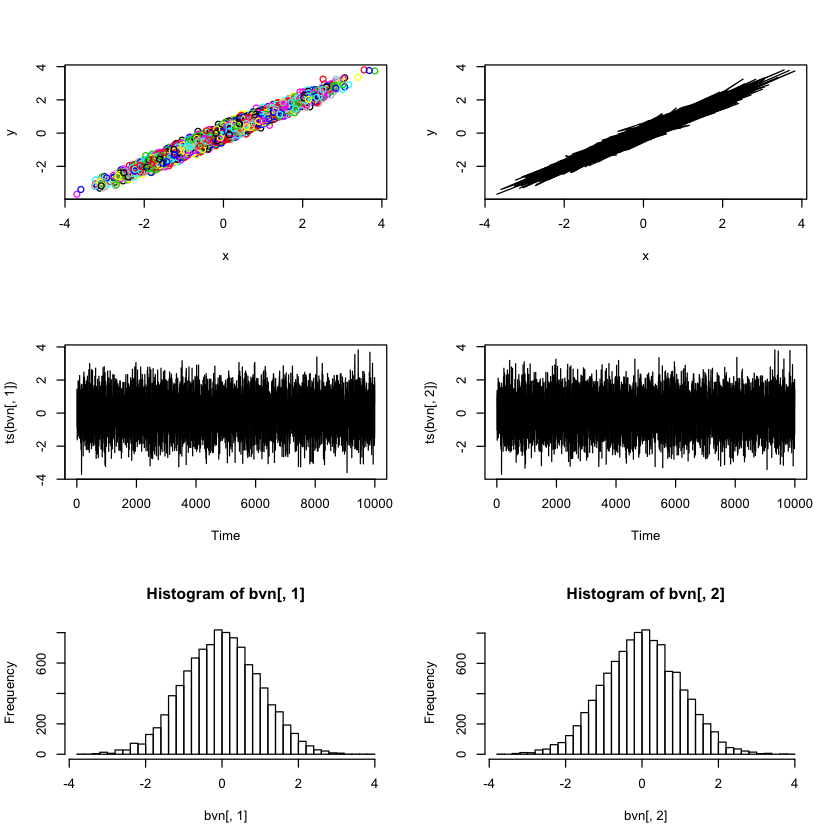

In [4]:
par(mfrow=c(3,2))
plot(bvn,col=1:10000)
plot(bvn,type="l")
plot(ts(bvn[,1]))
plot(ts(bvn[,2]))
hist(bvn[,1],40)
hist(bvn[,2],40)
par(mfrow=c(1,1))

In [5]:
gibbs<-function (n, rho) 
{
        mat <- matrix(ncol = 2, nrow = n)
        x <- 0
        y <- 0
        mat[1, ] <- c(x, y)
        for (i in 2:n) {
                x <- rnorm(1, rho * y, sqrt(1 - rho^2))
                y <- rnorm(1, rho * x, sqrt(1 - rho^2))
                mat[i, ] <- c(x, y)
        }
        mat
}

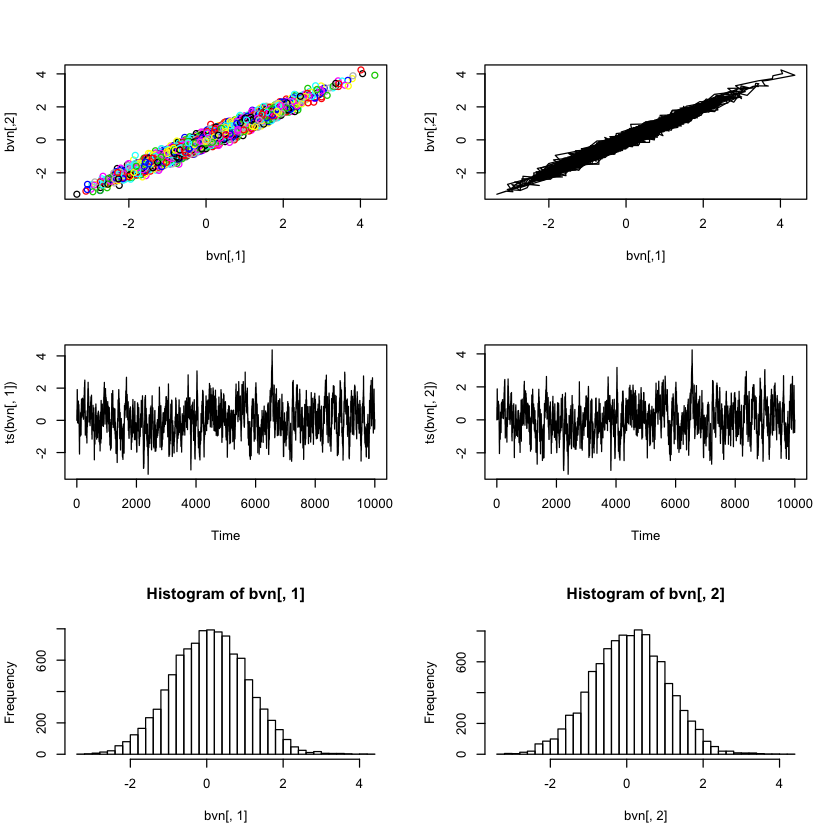

In [6]:
bvn<-gibbs(10000,0.98)
par(mfrow=c(3,2))
plot(bvn,col=1:10000)
plot(bvn,type="l")
plot(ts(bvn[,1]))
plot(ts(bvn[,2]))
hist(bvn[,1],40)
hist(bvn[,2],40)
par(mfrow=c(1,1))

### ACF 
* Figure 3.2 also shows that there is substantial dependence for replicates close together in the sequence. 
* If the chain is in the positive orthant along the ‘ridge’ created by the positive correlation, then it may take several (or more) moves to navigate into the negative orthant. 
* One way of measuring this serial or ‘time’ dependence is to compute the sample autocorrelation function (ACF),

#### 참고
* [7] ARIMA - http://www.slideshare.net/21_venkat/arima-26196965

<img src="figures/cap3.11.png" width=600 />

<img src="figures/cap3.12.png" width=600 />

* The top panel of Figure 3.4 shows the ACF for the first component of θ. The lag or ‘order’ of the <font color="red">autocorrelation</font> is the number of ‘periods’ or draws separating random variables in the chain (k in (3.2.4)). As we might expect, there is a fair amount of autocorrelation in the sequence of draws. However, by lag 10 or 12, there is no appreciable dependence.
* If this sampler is <font color="red">ergodic</font>, we can use sample averages of functions evaluated on the chain draws to estimate the expectations of those functions with respect to the <font color="red">stationary</font> distribution of the chain. Figure 3.3 suggests that the stationary distribution for this chain is actually the bivariate normal distribution. We can use the sample correlation of the draws of θ1 and the draws of θ2 to estimate the ‘population’ correlation or the expectation of the function h(θ) = θ1θ2 with respect to the bivariate normal.

<img src="figures/cap3.14.png" width=600 />

* The bottom panel of Figure 3.4 shows the sample correlation based on the Gibbs sampler draw sequence (dotted line) for samples of successively larger size, starting from the beginning of the chain. 
* For example, the value of the line corresponding to the horizontal axis value of 100 is the sample correlation based on replicates 0, 1, . . . , 100. 
* The figure illustrates the ergodicity of this chain. These sample averages rapidly converge to the true value of 0.9. The figure also illustrates the importance of a ‘burn-in’ period. 

<font color="red">The serial dependence in the Gibbs sampler draws is the price of this method. The estimates of integrals using these dependent draws can be substantially less efficient (in the sense of sampling error) than estimates based on iid draw sequences.</font>

# 3.3 SOME MARKOV CHAIN THEORY

#### continuous state space Markov chain

* In most instances, the parameters in models (remember this includes all unobservables) will be continuous random variables and π(•) will be a standard density. Thus, most of the Markov chains we will consider generate random variables with a continuous component in their transition distribution and the chain navigates in some subset of R^k.
* This sort of Markov chain is called a continuous state space Markov chain.

#### discrete state space Markov chain

* We will start, however, by considering discrete state space5 chains. Much of the intuition we develop for discrete state space chains carries over to the continuous case with some technical difficulties which we will note.
* Interest in discrete state space chains can be motivated by considering a discrete approximation to the posterior distribution. 

We have seen that we can motivate an interest in discrete state space Markov chains by discretizing the parameter space. If grids of m points are used for each component of θ, then any Markov chain would be defined on a state space with mk elements. 

<img src="figures/cap3.15.png" width=600 />

### DISCRETE APPROXIMATION ALGORITHM

<img src="figures/cap3.16.png" width=600 />

#### computational nightmare

* This seems like a very appealing general idea to construct iid samplers. In particular, it would work extremely well for the two-dimensional example in Figure 3.5 and a grid of 100 points on each axis. With k = 10 and a grid of 100 points, we would have to make 10 billion evaluations of the posterior density. 
* However, for complicated densities or larger dimensions this quickly becomes a computational nightmare since the computations required rise to the power of k. 
* Moreover, there is an assumption that we would know where π(•) concentrates its mass. Since the point of doing MCMC in the first place is to explore the posterior and see where its mass is, it may be difficult to lay down grids so that there is enough detail where the posterior is concentrated. Even if the posterior is unimodal, we do not know much about its spread and shape except by resort to asymptotic approximations.

#### handling high-dimensional problems

<img src="figures/eq3.3.1.png" width=600 />

#### Markov property 
The Markov property states that the conditional distribution of θr+1 depends only on θr and is independent of the ‘earlier’ history of the chain.

<img src="figures/cap3.17.png" width=600 />

#### irreducible & invariant

<img src="figures/cap3.18.png" width=600 />

Equation (3.3.3) is the reason why the stationary distribution is also called the invariant distribution. For discrete state space chains, irreducibility also implies ergodicity (chain averages of functions converge to their expectation under π).

#### time reversibility

* If presented with a discrete Markov chain that claims to have π as the stationary distribution, it is straightforward to check that (3.3.3) holds. 
* However, for <font color="red">more general state space chains</font>, it will turn out to be useful to have an equivalent property called time reversibility.
* <font color="red">Time reversibility states that, if we reverse the sequence order of a Markov chain, the resulting chain will have the same transition behavior.</font>

#### backward transition probability 

<img src="figures/cap3.19.png" width=600 />

To see that the ‘reversed’ or ‘backward’ chain is Markov, we can write this ratio using terms which involve the future r + 2 periods and beyond and other terms which involve only the rth and (r + 1)th period:

<img src="figures/cap3.20.png" width=600 />

#### The Markov property of the forward chain

<img src="figures/cap3.21.png" width=600 />

The conditional probabilities for periods r + 2, . . . , r + s cancel from the numerator and denominator. This means that the reversed chain is also Markov and, further, that

<img src="figures/cap3.22.png" width=600 />

<img src="figures/cap3.23.png" width=600 />

#### complete equivalence between reversibility and the stationarity of π

There is a complete equivalence between reversibility and the stationarity of π in the sense that <font color="red">if a chain is reversible with respect to some distribution ω then ω is also the stationary distribution of the chain</font>. Reversibility with respect to ω means ωi pij = ωj pji . Summing both sides over i, we obtain

<img src="figures/cap3.24.png" width=600 />

or

<img src="figures/cap3.25.png"  />

#### continuous state space case

In the continuous state space case, the transitional conditional distribution of θr+1|θr must have a continuous component.

#### kernel 

* Rather than specifying this distribution via the probabilities of each of the singletons {θi} that comprise the state space, we must specify the conditional distribution by associating probabilities with sets in the state space.
* For example, consider a set A ∈ 􏰖9 then the chain is specified by the probabilities of the set A given the value of the chain on the previous iteration. <font color="red">This is sometimes called the kernel of the chain</font>.

#### transition of the kernel

K (θ, A) is the probability of set A given the chain is at value θ. Some kernels (such as the one corresponding to the Gibbs sampler, but not all kernels) can be represented using a standard density,

<img src="figures/cap3.26.png" width=600 />

<img src="figures/cap3.27.png" width=600 />

<img src="figures/cap3.28.png" width=600 />

<img src="figures/cap3.29.png" width=600 />

<img src="figures/cap3.30.png" width=600 />

# 3.4 GIBBS SAMPLER

<img src="figures/cap3.31.png" width=600 />

<img src="figures/cap3.32.png" width=600 />

<img src="figures/cap3.33.png" width=600 />

<img src="figures/cap3.34.png" width=600 />

# 3.5 GIBBS SAMPLER FOR THE SEEMINGLY UNRELATED REGRESSION MODEL

#### 참고
* [10] Lecture 17 Seemingly Unrelated Regressions -  http://wlott.uconn.edu/EC310/Lecture17.ppt
* [11] Seemingly unrelated Regressions(SUR) - http://homepage.univie.ac.at/robert.kunst/pan2010_pres_gruber.pdf

In the SUR model, a system of m regression equations are related through correlated error terms:


<img src="figures/cap3.35.png" width=600 />

It will be convenient to stack up the m regressions in (3.5.1) into one large regression:

<img src="figures/cap3.36.png" width=600 />

A simple prior specification would be to
make β and 􏰗 a priori independent:

<img src="figures/cap3.37.png" width=600  />

These priors are not conjugate but they are conditionally conjugate.

<img src="figures/cap3.38.png" width=600  />

<img src="figures/cap3.39.png" width=600  />

#### 참고
* [8] Common Probability Distributions: The Data Scientist’s Crib Sheet - https://blog.cloudera.com/blog/2015/12/common-probability-distributions-the-data-scientists-crib-sheet/
* [9] The Wishart and inverse-wishart distribution - http://www.slideshare.net/risingstarpankaj/wishart-and-inversewishart-distribution

<img src="http://blog.cloudera.com/wp-content/uploads/2015/12/distribution.png" width=600 />

<img src="http://image.slidesharecdn.com/seminarpankaj-140908134953-phpapp02/95/the-wishart-and-inversewishart-distribution-38-638.jpg?cb=1410184312" width=600 />

### GIBBS SAMPLER FOR SUR MODEL

<img src="figures/cap3.40.png" width=600  />
<img src="figures/cap3.41.png" width=600  />

#### 참고
* [12] rsurGibbs {bayesm} : Gibbs Sampler for Seemingly Unrelated Regressions (SUR) - http://www.inside-r.org/packages/cran/bayesm/docs/rsurGibbs

In [19]:
#install.packages("bayesm")
library(bayesm)

In [20]:
R=1000
##
## simulate data from SUR
set.seed(66)
beta1=c(1,2)
beta2=c(1,-1,-2)
nobs=100
nreg=2
iota=c(rep(1,nobs))
X1=cbind(iota,runif(nobs))
X2=cbind(iota,runif(nobs),runif(nobs))
Sigma=matrix(c(.5,.2,.2,.5),ncol=2)
U=chol(Sigma)
E=matrix(rnorm(2*nobs),ncol=2)%*%U
y1=X1%*%beta1+E[,1]
y2=X2%*%beta2+E[,2]

In [21]:
##
## run Gibbs Sampler
regdata=NULL
regdata[[1]]=list(y=y1,X=X1)
regdata[[2]]=list(y=y2,X=X2)
 
Mcmc1=list(R=R)
 
out=rsurGibbs(Data=list(regdata=regdata),Mcmc=Mcmc1)

 
Starting Gibbs Sampler for SUR Regression Model
  with  2  regressions
  and   100  observations for each regression
 
Prior Parms: 
betabar
[1] 0 0 0 0 0
A
     [,1] [,2] [,3] [,4] [,5]
[1,] 0.01 0.00 0.00 0.00 0.00
[2,] 0.00 0.01 0.00 0.00 0.00
[3,] 0.00 0.00 0.01 0.00 0.00
[4,] 0.00 0.00 0.00 0.01 0.00
[5,] 0.00 0.00 0.00 0.00 0.01
nu =  5
V = 
     [,1] [,2]
[1,]    5    0
[2,]    0    5
 
MCMC parms: 
R=  1000  keep=  1  nprint=  100
 
 MCMC Iteration (est time to end - min) 
 100 (0.0)
 200 (0.0)
 300 (0.0)
 400 (0.0)
 500 (0.0)
 600 (0.0)
 700 (0.0)
 800 (0.0)
 900 (0.0)
 1000 (0.0)
 Total Time Elapsed: 0.00 


In [22]:
cat("Summary of beta draws",fill=TRUE)
summary(out$betadraw,tvalues=c(beta1,beta2))
cat("Summary of Sigmadraws",fill=TRUE)
summary(out$Sigmadraw,tvalues=as.vector(Sigma[upper.tri(Sigma,diag=TRUE)]))

Summary of beta draws
Summary of Posterior Marginal Distributions 
Moments 
  tvalues mean std dev num se rel eff sam size
1       1  1.0    0.13 0.0043    1.04      450
2       2  2.1    0.23 0.0082    1.14      450
3       1  1.3    0.17 0.0051    0.81      900
4      -1 -1.5    0.21 0.0063    0.80      900
5      -2 -1.8    0.24 0.0081    1.05      450

Quantiles 
  tvalues  2.5%    5%  50%  95% 97.5%
1       1  0.79  0.84  1.0  1.2   1.3
2       2  1.63  1.71  2.1  2.5   2.5
3       1  0.93  0.98  1.3  1.5   1.6
4      -1 -1.90 -1.85 -1.5 -1.1  -1.1
5      -2 -2.22 -2.15 -1.8 -1.4  -1.3
   based on 900 valid draws (burn-in=100) 
Summary of Sigmadraws
Posterior Means of Std Deviations and Correlation Matrix 
  Std Dev    1    2
1    0.74 1.00 0.51
2    0.74 0.51 1.00

Upper Triangle of Var-Cov Matrix 
Summary of Posterior Marginal Distributions 
Moments 
    tvalues mean std dev num se rel eff sam size
1,1     0.5 0.55   0.077 0.0024    0.90      900
1,2     0.2 0.28   0.062 0.0018 

Warning message:
: ‘mode(antialias)’ differs between new and previous
	 ==> NOT changing ‘antialias’

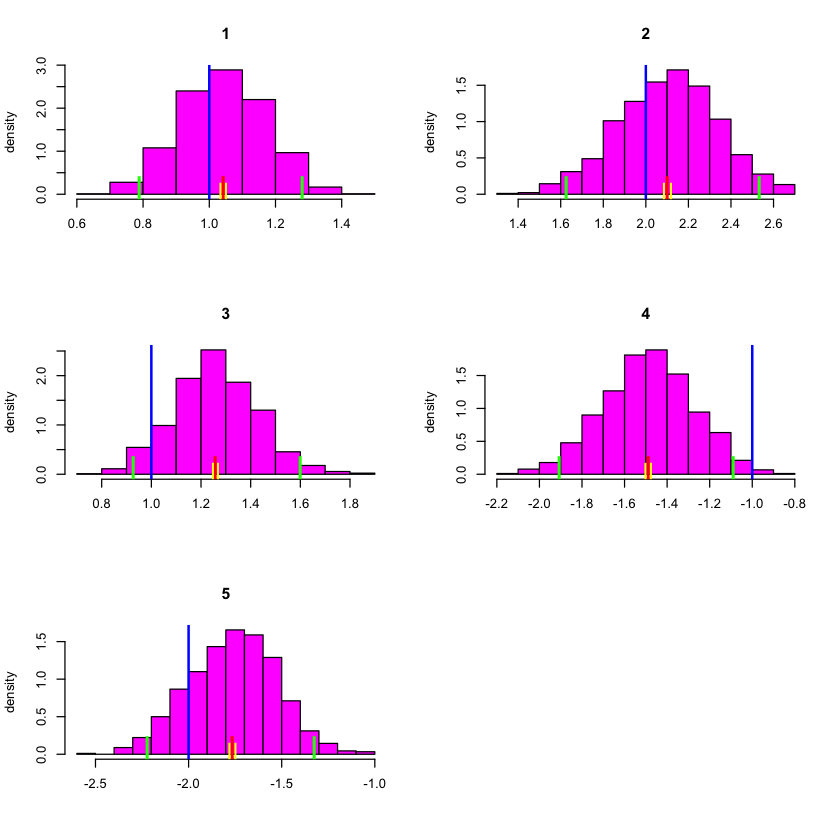

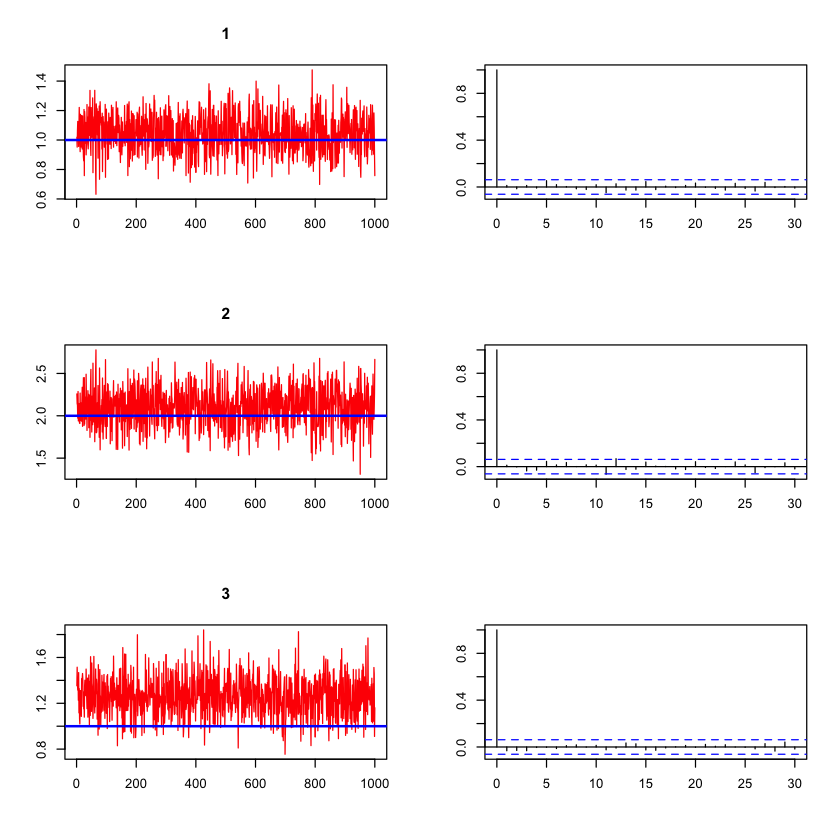

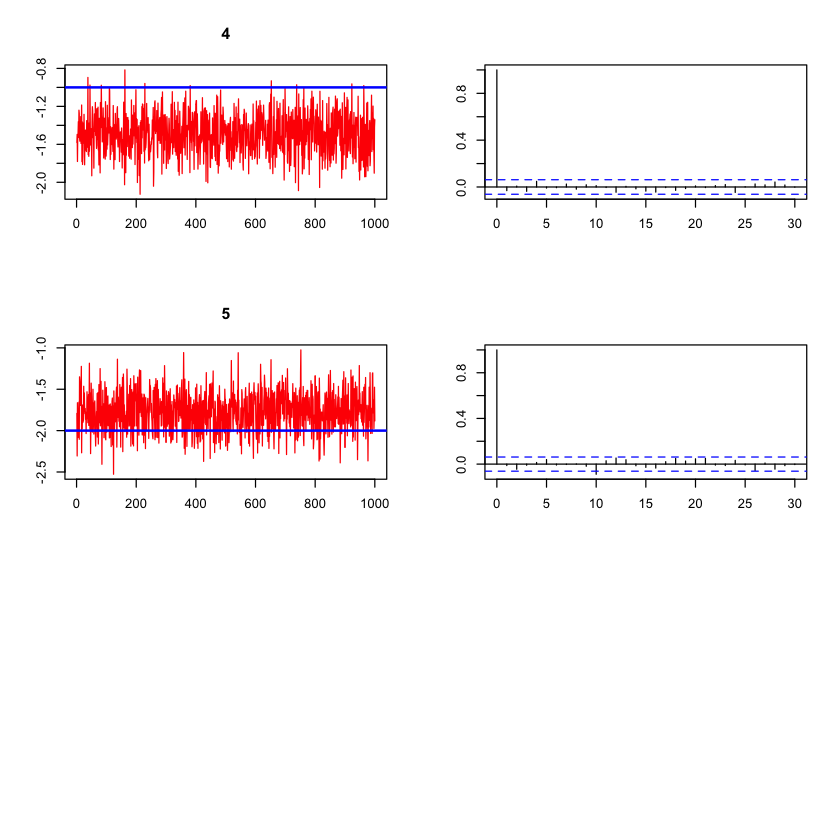

In [23]:
#R=1000
plot(out$betadraw,tvalues=c(beta1,beta2))

# 3.6 CONDITIONAL DISTRIBUTIONS AND DIRECTED GRAPHS

#### 참고
* [13] Part III Hierarchical Bayesian Models - https://cocosci.berkeley.edu/tom/talks/hierarchicalbayes.ppt
* [14] Brief Introduction to (Hierarchical) Bayesian Methods -  http://www.isse.ucar.edu/ams/present/wikle.pdf
* [15] stanford-pgm/slides/Introduction and Overview - http://spark-university.s3.amazonaws.com/stanford-pgm/slides/Section-1-Introduction-Combined.pdf
* [16] Bayesian Network Fundamentals - http://spark-university.s3.amazonaws.com/stanford-pgm/slides/Section-2-Representation-Bayes-Nets.pdf
* [17] Template Models - http://spark-university.s3.amazonaws.com/stanford-pgm/slides/Section-2-Representation-Template-Models.pdf

One of the most common applications of the Gibbs sampler is to hierarchical models. Hierarchical models are models constructed from a sequence of conditional distributions.

More generally, we can construct a model by ‘connecting’ or piecing together a set of conditional distributions in some sort of network or ‘graph’. 

In this section we provide a brief introduction to the basics of directed graphs. We will explain how to write a model as a directed graph and how to ‘read off’ the Gibbs sampler from a graph.

<img src="http://4.bp.blogspot.com/-aS610FQGfL0/UlWppYDDV7I/AAAAAAAAArg/zv79uqeZsdU/s1600/BayesDiagramComparison-rats-DBDA.png" width=600 />

<img src="http://i.stack.imgur.com/QXAmU.png"  />

#### directed acyclic’ graph (DAG)

<img src="http://images.slideplayer.com/15/4548842/slides/slide_23.jpg" width=600 />

First we would draw from the prior and then we would draw the data given the prior. This can be represented by a ‘directed acyclic’ graph (DAG).

<img src="figures/cap3.42.png" width=600  />

#### hierarchical model

A hierarchical model is specified through a sequence of two or more conditional distributions which specify the prior.

<img src="figures/cap3.43.png" width=600  />

Typically, $θ_{2}$ is of much lower dimension than $θ_{1}$. The sequence of two prior distributions can be thought of as a device to induce a marginal prior over $θ_{1}$:

<img src="figures/cap3.44.png" width=600  />

#### conditional independence & chain rule

<img src="http://joedumoulin.github.io/GraphicalModels1/figure/unnamed-chunk-6-1.png" width=600 />

<img src="http://images.slideplayer.com/16/5244869/slides/slide_20.jpg" width=600 />

<img src="http://images.slideplayer.com/24/7361129/slides/slide_39.jpg" width=600 />

<img src="http://i.stack.imgur.com/wwRRA.png" />

<img src="http://image.slidesharecdn.com/bayesnetwork-120312084530-phpapp01/95/bayesnetwork-22-728.jpg?cb=1331542641" width=600 />

<img src="figures/cap3.43.png" width=600  />

The hierarchical model in (3.6.2) specifies that θ2 and y are independent conditional on θ1 or that all dependence comes through θ1. We can easily verify this by writing down the joint distribution:

<img src="figures/cap3.45.png" width=600  />

<img src="figures/cap3.46.png" width=600  />

#### Indirect connection & d-separation

#### 참고
* [18] stanford-pgm/slides/Reasoning Patterns - http://spark-university.s3.amazonaws.com/stanford-pgm/slides/2.1.2-Repn-BNs-patterns.pdf

<img src="http://nbviewer.jupyter.org/github/psygrammer/qgm/blob/master/part1/pgmpy/ch01/figures/cap1.16.png" width=600 />

<img src="http://pubs.rsc.org/services/images/RSCpubs.ePlatform.Service.FreeContent.ImageService.svc/ImageService/Articleimage/2014/IB/c4ib00124a/c4ib00124a-f3_hi-res.gif" width=600 />

<img src="http://www.igi.tugraz.at/lehre/MLA/WS13/MLA_Exercises_2013/dSeparation.png" width=600 />

<img src="http://tumlum.iblogger.org/wp-content/uploads/2012/07/bayesball.png" width=600 />

<img src="figures/cap3.43.png" width=600  />

The hierarchical structure in (3.6.2) immediately suggests a ‘two-stage’ Gibbs sampler
to simulate from the distribution of ($θ_{1}$, $θ_{2}$) given y:

<img src="figures/cap3.47.png" width=600  />

It is possible to write down more complicated directed graphs. However, some simple rules can help understand the structure of dependence implied by the graph. There are three sorts of local node arrangements.

The first is a linear set of three nodes

<img src="figures/cap3.48.png" width=600  />

A Gibbs sampler for (3.6.5) is given by

<img src="figures/cap3.49.png" width=600  />

The next structure looks different but has the same feature of conditional indepen-
dence.

<img src="figures/cap3.50.png" width=600  />

The joint distribution implied by the graph in (3.6.7) is

<img src="figures/cap3.51.png" width=600  />

However, the structure formed from two nodes pointing into one node does not
display conditional independence:

<img src="figures/cap3.52.png" width=600  />

<img src="figures/cap3.53.png" width=600  />

All directed graphs are made up of some combination of three examples above. This suggests three rules for ‘reading’ the dependence structure from a graph. A node depends on:
* (i) any node it points to;
* (ii) any node that points to it;
* (iii) any node that points to the node directly ‘downstream’.

For example, consider the graph

<img src="figures/cap3.54.png" width=600  />

The Gibbs sampler for the graph in (3.6.10) is

<img src="figures/cap3.55.png" width=600  />

# 3.7 HIERARCHICAL LINEAR MODELS

<img src="figures/cap3.56.png" width=600  />

<img src="figures/cap3.57.png" width=600  />

<img src="figures/cap3.58.png" width=600  />

<img src="figures/cap3.59.png" width=600  />

<img src="figures/cap3.60.png" width=600  />

<img src="figures/cap3.61.png" width=600  />

<img src="figures/cap3.62.png" />

### GIBBS SAMPLER FOR HIERARCHICAL LINEAR MODEL

<img src="figures/cap3.63.png" width=600  />

<img src="figures/cap3.64.png" width=600  />

<img src="figures/cap3.65.png" width=600  />

<img src="figures/cap3.66.png" width=600  />

<img src="figures/cap3.67.png" width=600  />

# 3.8 DATA AUGMENTATION AND A PROBIT EXAMPLE

<img src="figures/cap3.68.png" width=600  />

<img src="figures/cap3.69.png" />

<img src="figures/cap3.70.png" width=600  />

<img src="figures/cap3.71.png" width=600  />

#### GIBBS SAMPLER FOR BINARY PROBIT

<img src="figures/cap3.72.png" width=600  />
<img src="figures/cap3.73.png" width=600  />

<img src="figures/cap3.74.png" width=600  />

<img src="figures/cap3.75.png" width=600  />

<img src="figures/cap3.76.png" width=600  />

# 3.9 MIXTURES OF NORMALS
* 3.9.1 Identification in Normal Mixtures
* 3.9.2 Performance of the Unconstrained Gibbs Sampler

<img src="figures/cap3.77.png" width=600  />

<img src="figures/cap3.78.png" width=600  />

<img src="figures/cap3.79.png"  />

<img src="figures/cap3.80.png" width=600  />

<img src="figures/cap3.81.png" width=600  />

<img src="figures/cap3.82.png" width=600  />

<img src="figures/cap3.83.png" width=600  />

<img src="figures/cap3.84.png" width=600  />

## 3.9.1 Identification in Normal Mixtures

<img src="figures/cap3.85.png" width=600  />

<img src="figures/cap3.86.png" width=600  />

<img src="figures/cap3.87.png" width=600  />

<img src="figures/cap3.88.png" width=600  />

## 3.9.2 Performance of the Unconstrained Gibbs Sampler

<img src="figures/cap3.89.png" width=600  />

<img src="figures/cap3.90.png" width=600  />

<img src="figures/cap3.91.png" width=600  />

# 3.10 METROPOLIS ALGORITHMS
* 3.10.1 Independence Metropolis Chains
* 3.10.2 Random-Walk Metropolis Chains
* 3.10.3 Scaling of the Random-Walk Metropolis

### DISCRETE METROPOLIS ALGORITHM

<img src="figures/cap3.92.png" width=600  />

<img src="figures/cap3.93.png" width=600  />

### CONTINUOUS STATE SPACE METROPOLIS

<img src="figures/cap3.94.png" width=600  />

<img src="figures/cap3.95.png" width=600  />

<img src="figures/cap3.96.png" width=600  />

## 3.10.1 Independence Metropolis Chains

### INDEPENDENCE METROPOLIS

<img src="figures/cap3.97.png" width=600  />
<img src="figures/cap3.98.png" width=600  />

<img src="figures/cap3.99.png"   />

## 3.10.2 Random-Walk Metropolis Chains

<img src="figures/cap3.100.png" width=600  />

### GAUSSIAN RANDOM-WALK METROPOLIS

<img src="figures/cap3.101.png" width=600  />

## 3.10.3 Scaling of the Random-Walk Metropolis

<img src="figures/cap3.102.png" width=600  />

<img src="figures/cap3.103.png" width=600  />

# 3.11 METROPOLIS ALGORITHMS ILLUSTRATED WITH THE MULTINOMIAL LOGIT MODEL

<img src="figures/cap3.104.png" width=600  />

<img src="figures/cap3.105.png" width=600  />

<img src="figures/cap3.106.png" width=600  />

<img src="figures/cap3.107.png" width=600  />

<img src="figures/cap3.108.png" width=600  />

<img src="figures/cap3.109.png" width=600  />

<img src="figures/cap3.110.png" width=600  />

# 3.12 HYBRID MARKOV CHAIN MONTE CARLO METHODS

<img src="figures/cap3.111.png" width=600  />

<img src="figures/cap3.112.png" width=600  />

<img src="figures/cap3.113.png" width=600  />

<img src="figures/cap3.114.png" width=600  />

<img src="figures/cap3.115.png" width=600  />

<img src="figures/cap3.116.png" width=600  />

<img src="figures/cap3.117.png" width=600  />

<img src="figures/cap3.118.png"   />

<img src="figures/cap3.119.png" width=600  />

# 3.13 DIAGNOSTICS

<img src="figures/cap3.120.png" width=600  />

### EXTENDED SAMPLER

<img src="figures/cap3.121.png" width=600  />

# 참고자료
* [0] 코드 - http://www.perossi.org/home/bsm-1
* [1] Bayesian Statistics and Marketing - http://www.amazon.com/Bayesian-Statistics-Marketing-Peter-Rossi/dp/0470863676
* [2] Sampling and Markov Chain Monte Carlo Techniques -  http://www.slideshare.net/TomaszKusmierczyk/sampling-and-markov-chain-monte-carlo-techniques
* [3] Markov Chain Monte Carlo explained - http://www.slideshare.net/dariodigiuni/markov-chain-monte-carlo-explained
* [4] A simple Gibbs sampler - http://www.mas.ncl.ac.uk/~ndjw1/teaching/sim/gibbs/gibbs.html
* [5] Example 1 (Gibbs sampler: Bivariate distribution) - http://staff.ustc.edu.cn/~zwp/teach/Stat-Comp/Lec9.R
* [6] MCMC: The Gibbs Sampler - https://theclevermachine.wordpress.com/2012/11/05/mcmc-the-gibbs-sampler/
* [7] ARIMA - http://www.slideshare.net/21_venkat/arima-26196965
* [8] Common Probability Distributions: The Data Scientist’s Crib Sheet - https://blog.cloudera.com/blog/2015/12/common-probability-distributions-the-data-scientists-crib-sheet/
* [9] The Wishart and inverse-wishart distribution - http://www.slideshare.net/risingstarpankaj/wishart-and-inversewishart-distribution
* [10] Lecture 17 Seemingly Unrelated Regressions -  http://wlott.uconn.edu/EC310/Lecture17.ppt
* [11] Seemingly unrelated Regressions(SUR) - http://homepage.univie.ac.at/robert.kunst/pan2010_pres_gruber.pdf
* [12] rsurGibbs {bayesm} : Gibbs Sampler for Seemingly Unrelated Regressions (SUR) - http://www.inside-r.org/packages/cran/bayesm/docs/rsurGibbs
* [13] Part III Hierarchical Bayesian Models - https://cocosci.berkeley.edu/tom/talks/hierarchicalbayes.ppt
* [14] Brief Introduction to (Hierarchical) Bayesian Methods -  http://www.isse.ucar.edu/ams/present/wikle.pdf
* [15] stanford-pgm/slides/Introduction and Overview - http://spark-university.s3.amazonaws.com/stanford-pgm/slides/Section-1-Introduction-Combined.pdf
* [16] stanford-pgm/slides/Bayesian Network Fundamentals - http://spark-university.s3.amazonaws.com/stanford-pgm/slides/Section-2-Representation-Bayes-Nets.pdf
* [17] stanford-pgm/slides/Template Models - http://spark-university.s3.amazonaws.com/stanford-pgm/slides/Section-2-Representation-Template-Models.pdf
* [18] stanford-pgm/slides/Reasoning Patterns - http://spark-university.s3.amazonaws.com/stanford-pgm/slides/2.1.2-Repn-BNs-patterns.pdf